### Starbucks Stores Dataset

## 1. Introduction:

#### Title: **Analyzing Global Distribution and Characteristics of Starbucks Stores**


#### Problem Statement:
- Starbucks is one of the world's most well-known coffee businesses with thousands of locations spread over various nations. Understanding Starbucks stores' distribution, ownership tendencies, and geographic locations is important for market research, expansion strategy, and accessibility to customers. The dataset is highly insightful into Starbucks stores' location and type globally. The task is to analyze this dataset and derive insights and conclusions regarding store distribution, types of ownership, regional focus, and missing values.

#### Objectives:
1. To analyze the geographical distribution of Starbucks stores worldwide.
2. To identify the most common ownership types across different regions.
3. To detect regions with the highest density of Starbucks stores.
4. To handle and analyze missing data for accurate insights.
5. To visualize store locations on global and regional maps.

#### Data Description:
- The dataset contains 25,600 records of Starbucks stores with the following attributes:
1. Brand: Brand name.
2. Store Number: Unique store id.
3. Store Name: Name of the store.
4. Ownership Type: Ownership classification.
5. Street Address: Physical street address of the store.
6. City: City where the store is located.
7. State/Province: State or province of the store.
8. Country: Country code (ISO format).
9. Postcode: Postal code.
10. Phone Number: Contact number.
11. Timezone: Store's timezone.
12. Longitude: Longitude coordinate of the store.
13. Latitude: Latitude coordinate of the store.

## 2. Importing Libraries

In [1]:
# importing  libraries

# general libraries
import numpy as np
import pandas as pd
import math
import re

# data visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px

# Data transformation library
import pycountry as pc
import pycountry_convert as pcc
from googletrans import Translator

## 3. Loading (Reading) Dataset

In [2]:
# Reading the dataset
df = pd.read_csv('starbucks.csv')

In [3]:
# Check the data loaded correctly or not by viewing the first 5 records of the dataset
df.head()

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,376818720,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.54,24.51


## Creating Copy of Dataset

In [4]:
# Creating a copy of the dataset
starbucks = df.copy()

In [5]:
starbucks.head()

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,376818720,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,NaN,NaN,GMT+04:00 Asia/Dubai,54.54,24.51


In [6]:
starbucks.tail()

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone,Longitude,Latitude
25595,Starbucks,21401-212072,Rex,Licensed,"141 Nguyễn Huệ, Quận 1, Góc đường Pasteur và L...",Thành Phố Hồ Chí Minh,SG,VN,70000,08 3824 4668,GMT+000000 Asia/Saigon,106.70,10.78
25596,Starbucks,24010-226985,Panorama,Licensed,"SN-44, Tòa Nhà Panorama, 208 Trần Văn Trà, Quận 7",Thành Phố Hồ Chí Minh,SG,VN,70000,08 5413 8292,GMT+000000 Asia/Saigon,106.71,10.72
25597,Starbucks,47608-253804,Rosebank Mall,Licensed,"Cnr Tyrwhitt and Cradock Avenue, Rosebank",Johannesburg,GT,ZA,2194,27873500159,GMT+000000 Africa/Johannesburg,28.04,-26.15
25598,Starbucks,47640-253809,Menlyn Maine,Licensed,"Shop 61B, Central Square, Cnr Aramist & Coroba...",Menlyn,GT,ZA,181,NaN,GMT+000000 Africa/Johannesburg,28.28,-25.79
25599,Starbucks,47609-253286,Mall of Africa,Licensed,"Shop 2077, Upper Level, Waterfall City",Midrand,GT,ZA,1682,27873500215,GMT+000000 Africa/Johannesburg,28.11,-26.02


## 4. Exploratory Data Analysis (EDA)

#### A) Basic Data Exploration

In [7]:
# Knowing the length of the datset
len(starbucks)

25600

In [8]:
# Getting more information about the data
starbucks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25600 entries, 0 to 25599
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Brand           25600 non-null  object 
 1   Store Number    25600 non-null  object 
 2   Store Name      25600 non-null  object 
 3   Ownership Type  25600 non-null  object 
 4   Street Address  25598 non-null  object 
 5   City            25585 non-null  object 
 6   State/Province  25600 non-null  object 
 7   Country         25600 non-null  object 
 8   Postcode        24078 non-null  object 
 9   Phone Number    18739 non-null  object 
 10  Timezone        25600 non-null  object 
 11  Longitude       25599 non-null  float64
 12  Latitude        25599 non-null  float64
dtypes: float64(2), object(11)
memory usage: 2.5+ MB


In [9]:
# Providing overall rows and columns
n_rows, n_columns = starbucks.shape
print("Total number of rows = ", n_rows)
print("Total number of columns = ", n_columns)

Total number of rows =  25600
Total number of columns =  13


In [10]:
# Displaying Statistics summary
starbucks.describe().T

,count,mean,std,min,25%,50%,75%,max
Longitude,25599.0,-27.872234,96.844046,-159.46,-104.665,-79.35,100.63,176.92
Latitude,25599.0,34.793016,13.342332,-46.41,31.240,36.75,41.57,64.85


In [11]:
starbucks.describe(include='object')

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Phone Number,Timezone
count,25600,25600,25600,25600,25598,25585,25600,25600,24078,18739,25600
unique,4,25599,25364,4,25353,5469,338,73,18887,18402,101
top,Starbucks,19773-160973,Starbucks,Company Owned,"Circular Building #6, Guard Post 8",上海市,CA,US,0,4.20E+11,GMT-05:00 America/New_York
freq,25249,2,224,11932,11,542,2821,13608,101,27,4889


#### B) Univariate, Bivariate, and Multivariate Data Analysis

In [12]:
# Checking for missing values
starbucks.isnull().sum()

Brand                0
Store Number         0
Store Name           0
Ownership Type       0
Street Address       2
City                15
State/Province       0
Country              0
Postcode          1522
Phone Number      6861
Timezone             0
Longitude            1
Latitude             1
dtype: int64

In [13]:
# Dropping Phone Number column due to high number of missing values
starbucks.drop(columns=['Phone Number'], inplace=True)

In [14]:
starbucks.head()

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,NaN,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,NaN,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,NaN,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,NaN,GMT+04:00 Asia/Dubai,54.54,24.51


In [15]:
# Filling missing Postcode with a placeholder
starbucks['Postcode'] = starbucks['Postcode'].fillna('00000')

In [16]:
starbucks.isnull().sum()

Brand              0
Store Number       0
Store Name         0
Ownership Type     0
Street Address     2
City              15
State/Province     0
Country            0
Postcode           0
Timezone           0
Longitude          1
Latitude           1
dtype: int64

In [17]:
starbucks[starbucks.isnull().any(axis=1)]

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Timezone,Longitude,Latitude
5069,Starbucks,31657-104436,سان ستيفانو,Licensed,طريق الكورنيش أبراج سان ستيفانو,NaN,ALX,EG,00000,GMT+2:00 Africa/Cairo,29.96,31.24
5088,Starbucks,32152-109504,النايل سيتى,Licensed,كورنيش النيل أبراج النايل سيتى,NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.23,30.07
5089,Starbucks,32314-115172,أسكندرية الصحراوى,Licensed,"الكيلو 28 طريق الاسكندرية الصحراوى, سيتى سنتر ...",NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.03,30.06
5090,Starbucks,31479-105246,مكرم عبيد,Licensed,"شارع مكرم عبيد, سيتى ستارز مول",NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.34,30.09
5091,Starbucks,31756-107161,سيتى ستارز 1,Licensed,"شارع عمر بن الخطاب, سيتى ستارز مول",NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.33,30.06
5092,Starbucks,1397-139244,سيتى ستارز 3,Licensed,"شارع عمر بن الخطاب, كارفور المعادى",NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.33,30.06
5093,Starbucks,32191-116645,معادى سيتى سنتر,Licensed,القطامية الطريق الدائرى,NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.30,29.99
5094,Starbucks,3664-142484,سليمان أباظة,Licensed,"34شارع سليمان أباظة المهندسين, تيفولى مول",NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.20,30.06
5095,Starbucks,3562-131562,تيفولى,Licensed,"ألماظة ميدان الجوهر شارع أحمد فوزى, صالة السفر 1",NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.34,30.08
5096,Starbucks,31646-106547,مطار القاهرة,Licensed,"صالة السفر 1- مطار القاهرة, فندق سنافير",NaN,C,EG,00000,GMT+2:00 Africa/Cairo,31.41,30.11


In [18]:
# Dropping rows with missing Latitude or Longitude
starbucks.dropna(subset=['Latitude', 'Longitude'], inplace=True)

In [19]:
# Filling missing City values with 'Unknown'
starbucks['City'] = starbucks['City'].fillna('Unknown')

In [20]:
starbucks.isnull().sum()

Brand             0
Store Number      0
Store Name        0
Ownership Type    0
Street Address    2
City              0
State/Province    0
Country           0
Postcode          0
Timezone          0
Longitude         0
Latitude          0
dtype: int64

In [21]:
starbucks[starbucks.isnull().any(axis=1)]
# We can't drop or add some value to this missing data since it is important, we are keeping it the same for now

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Timezone,Longitude,Latitude
8442,Starbucks,30997-103902,베네시티점,Joint Venture,NaN,부산,26,KR,612-020,GMT+09:00 Asia/Seoul,129.15,35.16
8577,Starbucks,1329-152826,광주충장로점,Joint Venture,NaN,광주,29,KR,501-013,GMT+09:00 Asia/Seoul,126.91,35.15


In [22]:
# We can fill Unknown for it as well instead of NaN
starbucks['Street Address'] = starbucks['Street Address'].fillna('Unknown')

In [23]:
starbucks.isnull().sum()

Brand             0
Store Number      0
Store Name        0
Ownership Type    0
Street Address    0
City              0
State/Province    0
Country           0
Postcode          0
Timezone          0
Longitude         0
Latitude          0
dtype: int64

In [24]:
# Check for duplicated rows
starbucks.duplicated().sum()

0

#### Solving Country code and different language city names issue.

- We would like to work with country names and not codes.
- Additionally we would like to add the continent as well for more insights.
- To solve these issues we have used a library called `pycountry`.
- `pycountry` is a Python library that provides access to the ISO databases for countries, country subdivisions, languages, currencies, and scripts
- `pycountry_convert` package provides conversion functions between ISO country names, country-codes, and continent names.:


In [25]:
# Creating another copy of data
starbucks_transformed = starbucks.copy()

In [26]:
starbucks_transformed.head()

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Timezone,Longitude,Latitude
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,AD,AD500,GMT+1:00 Europe/Andorra,1.53,42.51
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,AE,00000,GMT+04:00 Asia/Dubai,55.47,25.42
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,AE,00000,GMT+04:00 Asia/Dubai,55.47,25.39
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,AE,00000,GMT+04:00 Asia/Dubai,54.38,24.48
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,AE,00000,GMT+04:00 Asia/Dubai,54.54,24.51


In [27]:
# Transforming country code to country name and adding continents column as well
starbucks_transformed['Country_ISO'] = starbucks_transformed['Country']
starbucks_transformed['Country'] = starbucks_transformed['Country'].apply(lambda country: pc.countries.get(alpha_2=country).name)
starbucks_transformed['Continent'] = starbucks_transformed['Country_ISO'].apply(
    lambda country: pcc.country_alpha2_to_continent_code(country)).apply(
    lambda cont: pcc.convert_continent_code_to_continent_name(cont))

In [28]:
starbucks_transformed.head()

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Timezone,Longitude,Latitude,Country_ISO,Continent
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,Andorra,AD500,GMT+1:00 Europe/Andorra,1.53,42.51,AD,Europe
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,55.47,25.42,AE,Asia
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,55.47,25.39,AE,Asia
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,54.38,24.48,AE,Asia
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,54.54,24.51,AE,Asia


In [29]:
len(starbucks_transformed)

25599

In [30]:
def is_non_english(text):
    return bool(re.search('[^\x00-\x7F]+', text))

# Filter cities that contain non-English characters
non_english_cities = starbucks_transformed[starbucks_transformed['City'].apply(is_non_english)]['City'].unique()

# Show the result
print(non_english_cities)

['البحرين' 'الزينج' 'المنامة' 'سند' 'Atrium Térreo' '北京市' '廊坊市' '天津市'
 '保定市' '唐山市' '张家口' '承德市' '石家庄' '秦皇岛' '邢台市' '邯郸' '太原市' '包头市' '呼和浩特' '大连市'
 '抚顺市' '沈阳市' '盘锦市' '营口市' '鞍山市' '吉林市' '延吉市' '长春市' '哈尔滨' '大庆市' '上海市' '宁波市'
 '浦东新区' '南京市' '南通市' '吴江市' '太仓市' '姜堰市' '宜兴市' '宿迁市' '常州市' '常熟市' '张家港' '张家港市'
 '徐州市' '扬中市' '扬州市' '无锡市' '昆山市' '江苏省' '江阴市' '泰州市' '海门市' '淮安市' '溧阳市' '盐城市'
 '苏州市' '连云港' '连云港市' '镇江市' '靖江市' '高邮市' '上虞市' '东阳市' '丽水市' '临海市' '义乌市' '乐清市'
 '余姚市' '兰溪市' '台州市' '嘉兴' '嘉兴市' '嘉善市' '奉化市' '慈溪市' '杭州市' '江山市' '海宁市' '温岭市'
 '温州市' '湖州市' '绍兴市' '舟山市' '萧山市' '衢州市' '诸暨市' '金华市' '合肥市' '芜湖市' '蚌埠市' '马鞍山'
 '厦门市' '宁德市' '泉州市' '漳州市' '福州市' '莆田市' '龙岩市' '九江市' '南昌市' '东营市' '临沂市' '威海市'
 '德州市' '日照市' '泰安市' '济南市' '济宁市' '淄博市' '潍坊市' '烟台市' '青岛市' '洛阳' '郑州市' '十堰市'
 '宜昌市' '武汉市' '襄樊市' '襄阳市' '黄石市' '岳阳市' '株洲市' '湘潭市' '衡阳市' '长沙市' '东莞市' '中山市'
 '佛山市' '广州市' '惠州市' '梅州市' '汕头市' '江门市' '深圳市' '清远市' '湛江市' '珠海市' '肇庆市' '阳江市'
 '北海市' '南宁市' '柳州' '桂林' '三亚市' '儋州市' '海口市' '重庆市' '乐山市' '德阳市' '成都市' '绵阳市'
 '贵阳' '贵阳市' '丽江市' '大理市' '昆明市' '咸阳市' '宝鸡市' '西安市' '兰州市' '

#### Observation:
- We can see that in the DataFrame, many value in the City column are not in English.
- We detect it and translate it to English.

In [31]:
# Initialize the translator
translator = Translator()

# Create a manual mapping for cities that require translation to their English equivalents
manual_translation_map = {
    'KÖLN': 'Cologne',
    'MÜNSTER': 'Munster',
    'Wrocław': 'Wroclaw',
    'Łódź': 'Lodz',
    'Gdańsk': 'Gdansk',
    'Poznań': 'Poznan',
    'Täby': 'Tabby',
    'Breña': 'Brena',
    'Stjørdal': 'Stjordal'
}

# Translate the non-English cities
translated_cities = {}

for city in non_english_cities:
    try:
        # Check if the city is a valid string (non-empty)
        if city:
            # Strip any extra whitespace or non-visible characters from the city name
            city = city.strip()

            # If the city has a manual translation, use it
            if city in manual_translation_map:
                translated_cities[city] = manual_translation_map[city]
            else:
                # Ensure the city is not empty after stripping
                if city:
                    translated = translator.translate(city, src='auto', dest='en').text
                    # Check if the translation returned is the same as the input city
                    if translated == city:
                        # If the translation did not change, use the manual translation map if applicable
                        translated_cities[city] = manual_translation_map.get(city, translated)
                    else:
                        translated_cities[city] = translated
                else:
                    translated_cities[city] = 'Invalid city name'
        else:
            translated_cities[city] = 'Invalid city name'
    except Exception as e:
        # Handle any errors during translation
        print(f"Error translating '{city}': {e}")
        translated_cities[city] = 'Translation failed'

# Print the results
for original, translated in translated_cities.items():
    if translated != 'Translation failed' and translated != 'Invalid city name':
        print(f"Original: {original} -> Translated: {translated}")
    else:
        print(f"Original: {original} -> {translated}")

Original: البحرين -> Translated: Bahrain
Original: الزينج -> Translated: Zin
Original: المنامة -> Translated: Manama
Original: سند -> Translated: Document
Original: Atrium Térreo -> Translated: Ground floor
Original: 北京市 -> Translated: Beijing
Original: 廊坊市 -> Translated: Langfang City
Original: 天津市 -> Translated: Tianjin
Original: 保定市 -> Translated: Baoding City
Original: 唐山市 -> Translated: Tangshan City
Original: 张家口 -> Translated: Zhangjiakou
Original: 承德市 -> Translated: Chengde City
Original: 石家庄 -> Translated: Shijiazhuang
Original: 秦皇岛 -> Translated: Qinhuangdao
Original: 邢台市 -> Translated: Xingtai City
Original: 邯郸 -> Translated: Handan
Original: 太原市 -> Translated: Taiyuan City
Original: 包头市 -> Translated: Baotou City
Original: 呼和浩特 -> Translated: Hohhot
Original: 大连市 -> Translated: Dalian City
Original: 抚顺市 -> Translated: Fushun City
Original: 沈阳市 -> Translated: Shenyang City
Original: 盘锦市 -> Translated: Panjin City
Original: 营口市 -> Translated: Yingkou City
Original: 鞍山市 -> Tra

In [32]:
starbucks_transformed['Translated_City'] = starbucks_transformed['City'].apply(
    lambda x: translated_cities.get(x.strip(), 'Translation failed') if is_non_english(x) else x
)

In [33]:
starbucks_transformed

,Brand,Store Number,Store Name,Ownership Type,Street Address,City,State/Province,Country,Postcode,Timezone,Longitude,Latitude,Country_ISO,Continent,Translated_City
0,Starbucks,47370-257954,"Meritxell, 96",Licensed,"Av. Meritxell, 96",Andorra la Vella,7,Andorra,AD500,GMT+1:00 Europe/Andorra,1.53,42.51,AD,Europe,Andorra la Vella
1,Starbucks,22331-212325,Ajman Drive Thru,Licensed,"1 Street 69, Al Jarf",Ajman,AJ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,55.47,25.42,AE,Asia,Ajman
2,Starbucks,47089-256771,Dana Mall,Licensed,Sheikh Khalifa Bin Zayed St.,Ajman,AJ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,55.47,25.39,AE,Asia,Ajman
3,Starbucks,22126-218024,Twofour 54,Licensed,Al Salam Street,Abu Dhabi,AZ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,54.38,24.48,AE,Asia,Abu Dhabi
4,Starbucks,17127-178586,Al Ain Tower,Licensed,"Khaldiya Area, Abu Dhabi Island",Abu Dhabi,AZ,United Arab Emirates,00000,GMT+04:00 Asia/Dubai,54.54,24.51,AE,Asia,Abu Dhabi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25595,Starbucks,21401-212072,Rex,Licensed,"141 Nguyễn Huệ, Quận 1, Góc đường Pasteur và L...",Thành Phố Hồ Chí Minh,SG,Viet Nam,70000,GMT+000000 Asia/Saigon,106.70,10.78,VN,Asia,Ho Chi Minh City
25596,Starbucks,24010-226985,Panorama,Licensed,"SN-44, Tòa Nhà Panorama, 208 Trần Văn Trà, Quận 7",Thành Phố Hồ Chí Minh,SG,Viet Nam,70000,GMT+000000 Asia/Saigon,106.71,10.72,VN,Asia,Ho Chi Minh City
25597,Starbucks,47608-253804,Rosebank Mall,Licensed,"Cnr Tyrwhitt and Cradock Avenue, Rosebank",Johannesburg,GT,South Africa,2194,GMT+000000 Africa/Johannesburg,28.04,-26.15,ZA,Africa,Johannesburg
25598,Starbucks,47640-253809,Menlyn Maine,Licensed,"Shop 61B, Central Square, Cnr Aramist & Coroba...",Menlyn,GT,South Africa,181,GMT+000000 Africa/Johannesburg,28.28,-25.79,ZA,Africa,Menlyn


In [34]:
non_english_cities = starbucks_transformed[starbucks_transformed['Translated_City'].apply(is_non_english)]['City'].unique()

# Show the result
print(non_english_cities)

[]


#### Observation:
- We can see that now all the values of the City are in English

#### Univariate Analysis

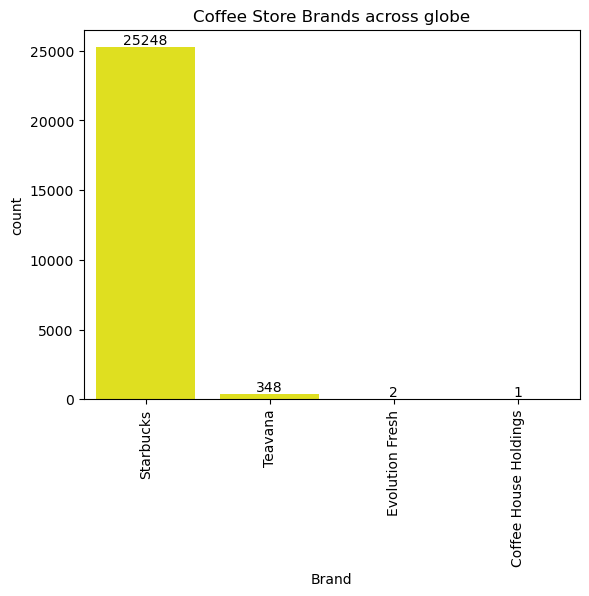

In [35]:
uni =sns.countplot(data=starbucks_transformed, x='Brand', color='yellow')
uni.bar_label(uni.containers[0])
plt.title("Coffee Store Brands across globe")
plt.xticks(rotation=90);

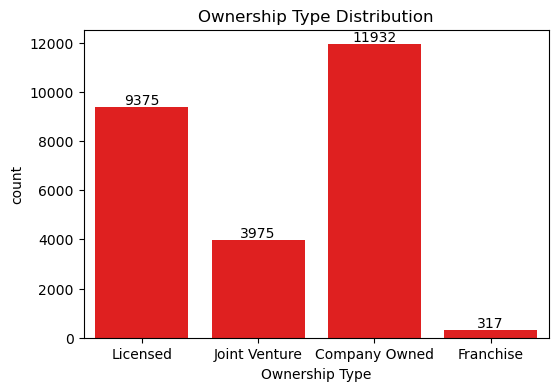

In [36]:
# Ownership Type Distribution
plt.figure(figsize=(6,4))
bi = sns.countplot(x=starbucks_transformed['Ownership Type'], color='red')
bi.bar_label(bi.containers[0])
plt.title("Ownership Type Distribution");

#### Bivariate Analysis

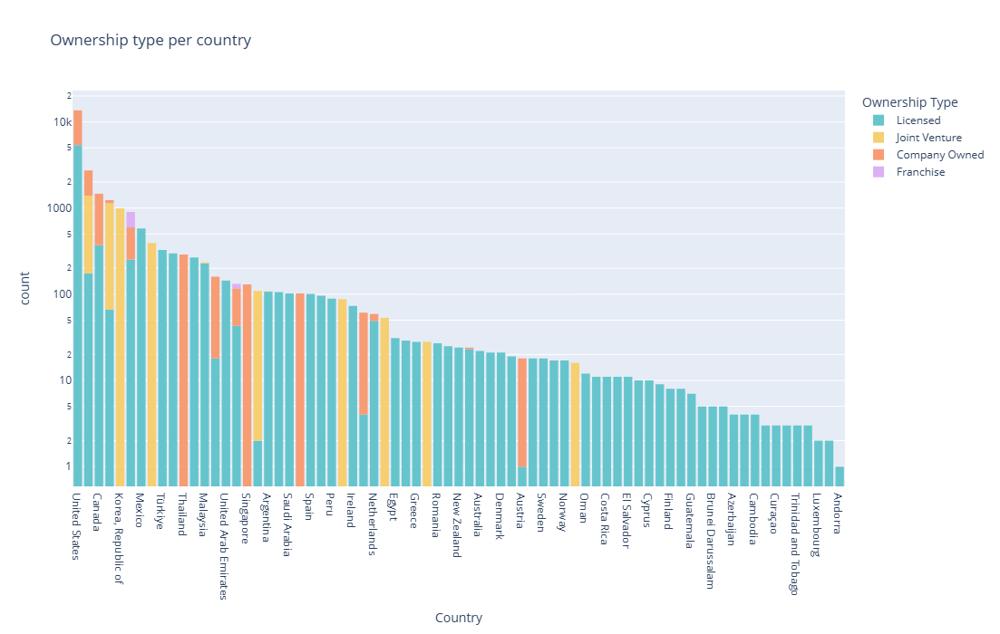

In [37]:
# Ownership type per country
ownership = px.histogram(starbucks_transformed , x='Country' , color='Ownership Type' , labels={'count' : 'No. of Stores'} , 
             title='Ownership type per country' , color_discrete_sequence=px.colors.qualitative.Pastel , 
             log_y=True).update_xaxes(categoryorder = 'total descending')

ownership.update_layout(
    height=700,  
)

#### Multivariate Analysis

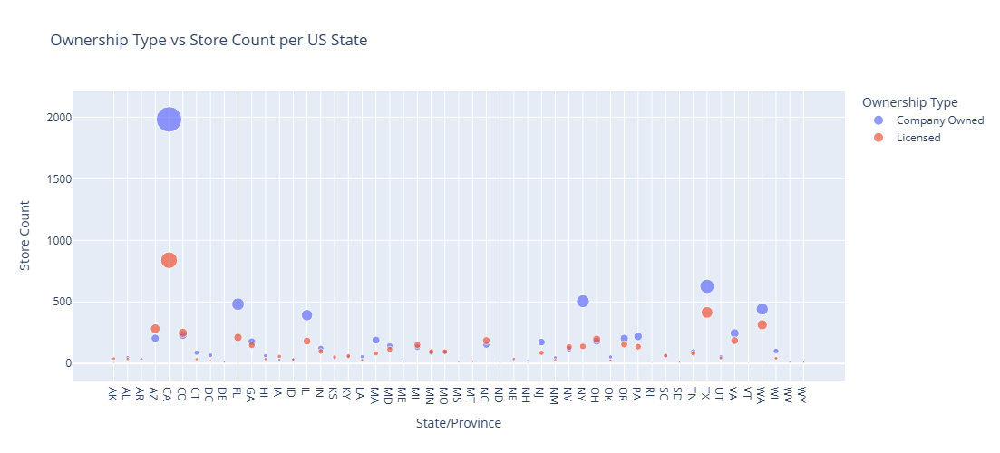

In [38]:
# Ownership Type vs Store Count per US State

# Aggregate data for US states
us_starbucks = starbucks_transformed[starbucks_transformed['Country_ISO'] == "US"]
us_state_ownership = us_starbucks.groupby(['State/Province', 'Ownership Type']).size().reset_index(name='Store Count')

# Bubble Chart
fig = px.scatter(us_state_ownership, 
                 x='State/Province', 
                 y='Store Count', 
                 size='Store Count', 
                 color='Ownership Type',
                 hover_name='State/Province',
                 title="Ownership Type vs Store Count per US State")

fig.update_layout(
    height=500,  
)

#### C) Data Visualization

In [39]:
# Limit to top 10 countries
top_countries = starbucks_transformed['Country'].value_counts().head(10).index
filtered_df = starbucks_transformed[starbucks_transformed['Country'].isin(top_countries)]
top_countries

Index(['United States', 'China', 'Canada', 'Japan', 'Korea, Republic of',
       'United Kingdom', 'Mexico', 'Taiwan, Province of China', 'Türkiye',
       'Philippines'],
      dtype='object', name='Country')

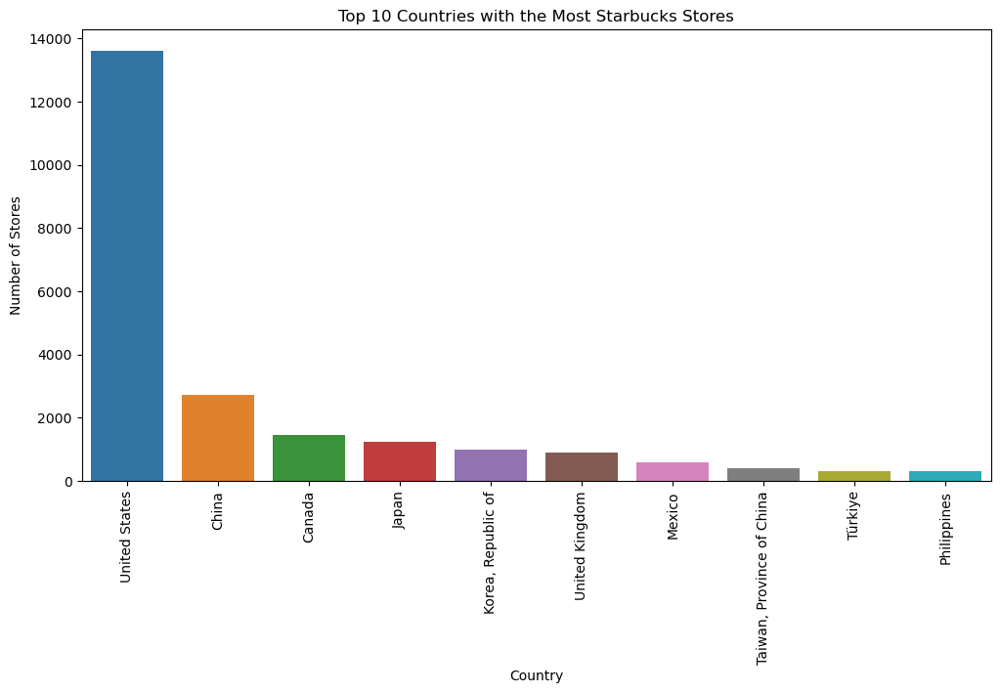

In [40]:
# Top 10 Countries with the Most Starbucks Stores
top_countries = starbucks_transformed['Country'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_countries.index, y=top_countries.values, hue=top_countries.index)
plt.xlabel("Country")
plt.ylabel("Number of Stores")
plt.title("Top 10 Countries with the Most Starbucks Stores")
plt.xticks(rotation=90);

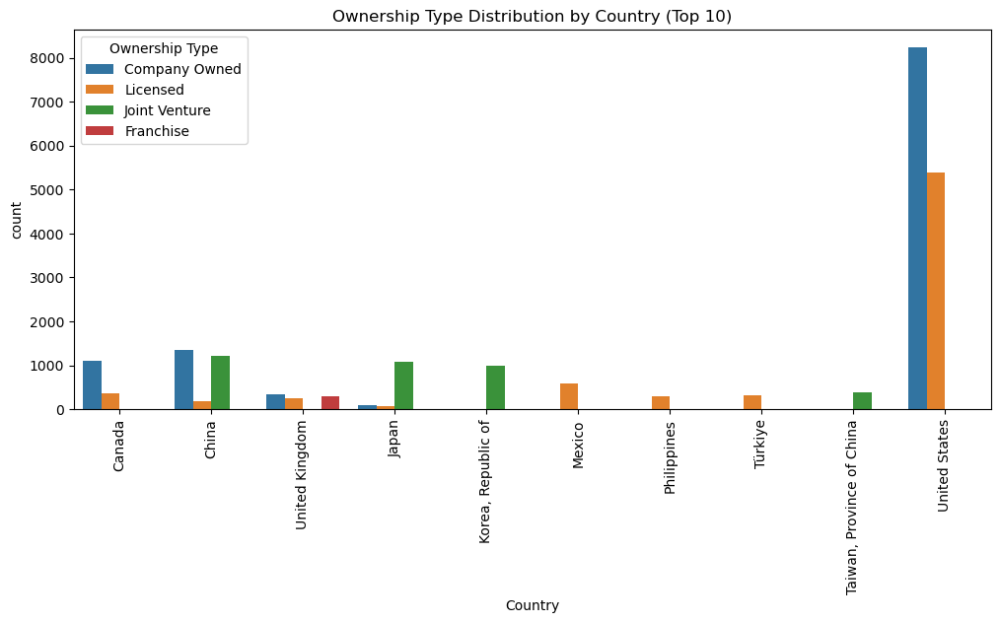

In [41]:
# Stacked bar chart to see ownership type distribution by country

plt.figure(figsize=(12, 5))
sns.countplot(data=filtered_df, x='Country', hue='Ownership Type')
plt.title("Ownership Type Distribution by Country (Top 10)")
plt.xticks(rotation=90);
# plt.tight_layout()
# plt.show()

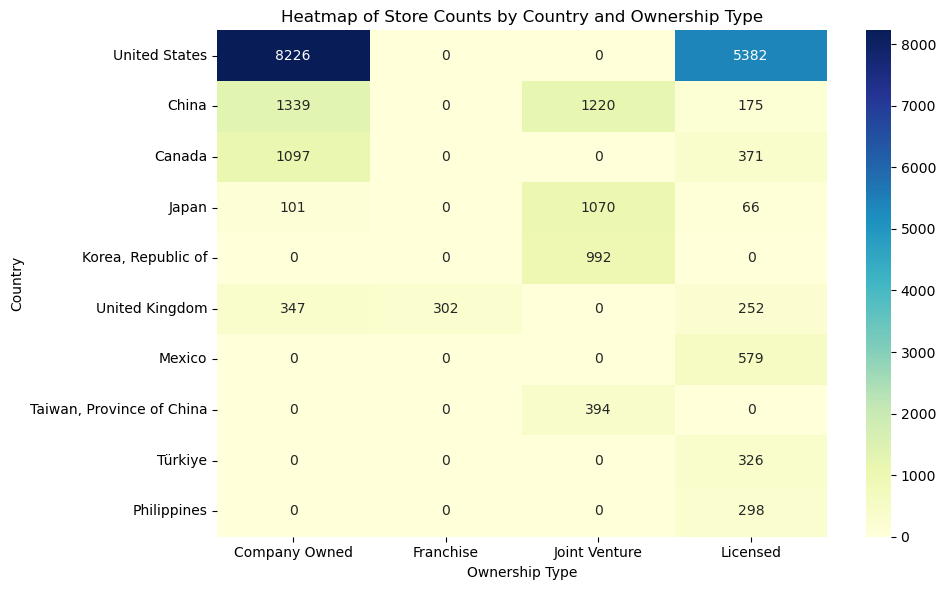

In [42]:
# Creating a crosstab matrix: Country vs. Ownership Type

ownership_matrix = pd.crosstab(starbucks_transformed['Country'], starbucks_transformed['Ownership Type'])

# Select top 10 countries by store count
top_countries = starbucks_transformed['Country'].value_counts().head(10).index

# Filter the crosstab to only include top countries
ownership_matrix_top = ownership_matrix.loc[top_countries]

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(ownership_matrix_top, annot=True, fmt='d', cmap='YlGnBu')

# Title and formatting
plt.title("Heatmap of Store Counts by Country and Ownership Type")
plt.xlabel("Ownership Type")
plt.ylabel("Country")
plt.tight_layout()
plt.show()

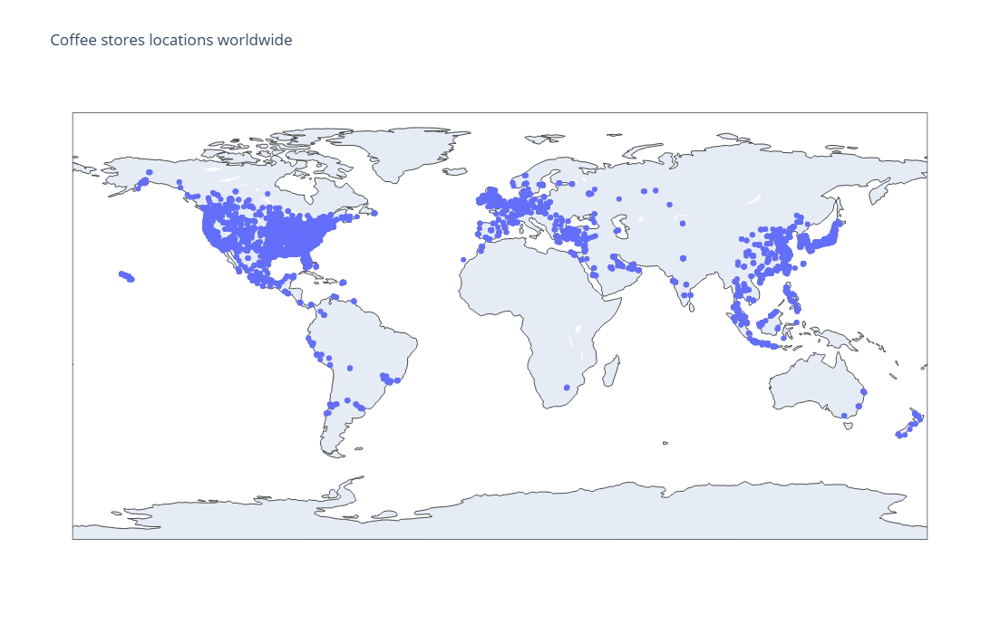

In [43]:
# Coffee Stores locations worldwide

map = px.scatter_geo(starbucks_transformed, lat='Latitude', lon='Longitude' , hover_name='Store Name' ,
                      size_max = 20 , title='Coffee stores locations worldwide')
map.update_layout(
    width=1100, 
    height=700,  
)


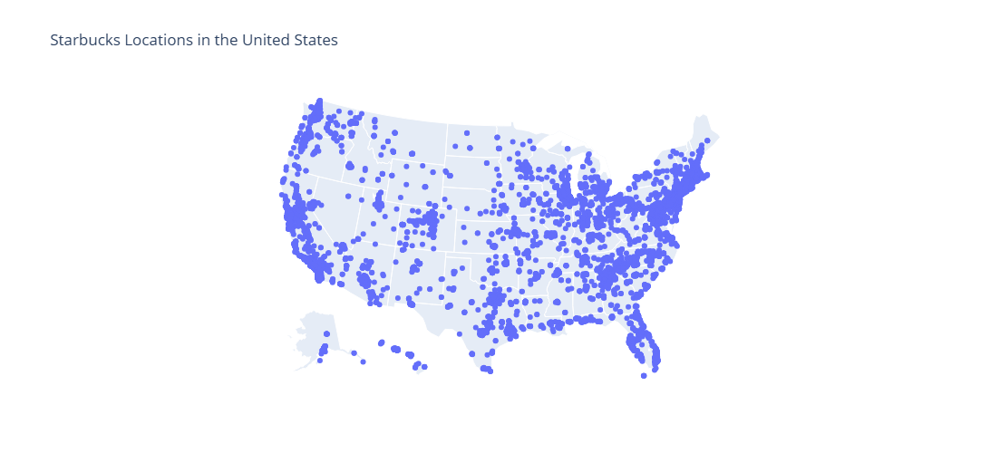

In [44]:
# Starbucks Locations in the United States
map_usa = px.scatter_geo(
    starbucks_transformed[(starbucks_transformed['Country_ISO'] == "US") & (starbucks_transformed['Brand'] == 'Starbucks')], 
    locationmode='USA-states',
    scope='usa',
    lat='Latitude',
    lon='Longitude',
    hover_name='Store Name',
    size_max=10,
    title='Starbucks Locations in the United States'
)

map_usa.update_layout(
    width=1100, 
    height=500,  
)

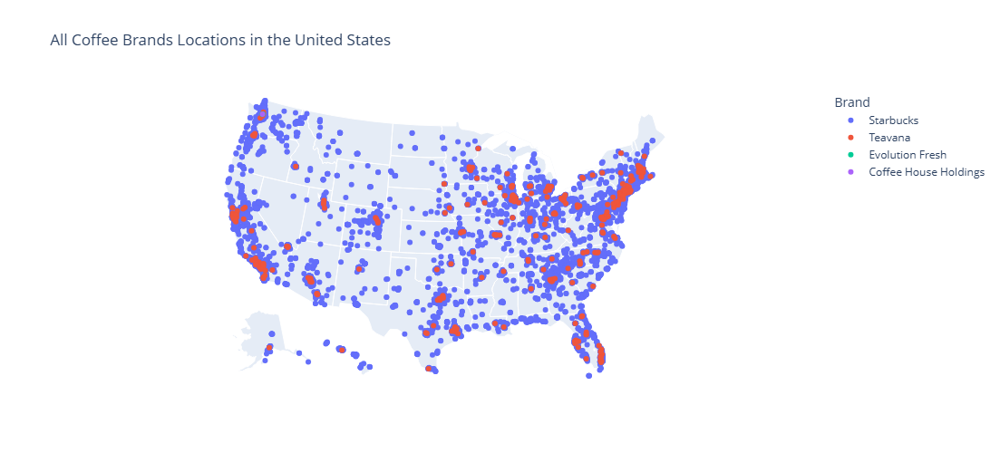

In [45]:
# All Coffee Brands Locations in the United States 

# Filter for the United States only
usa_data = starbucks_transformed[(starbucks_transformed['Country'] == 'United States')]

# Create a map of USA locations (scatter_geo)
map_usa = px.scatter_geo(
    usa_data, 
    lat='Latitude',  # Latitude for the scatter plot
    lon='Longitude',  # Longitude for the scatter plot
    scope='usa',
    color='Brand',
    hover_name='Brand',  # Hover shows the Brand name
    title='All Coffee Brands Locations in the United States'
)

# Update layout to adjust map appearance
map_usa.update_layout(
    width=1100,  # Adjust width of the plot
    height=500,  # Adjust height of the plot
)

# Show the plot
map_usa.show()

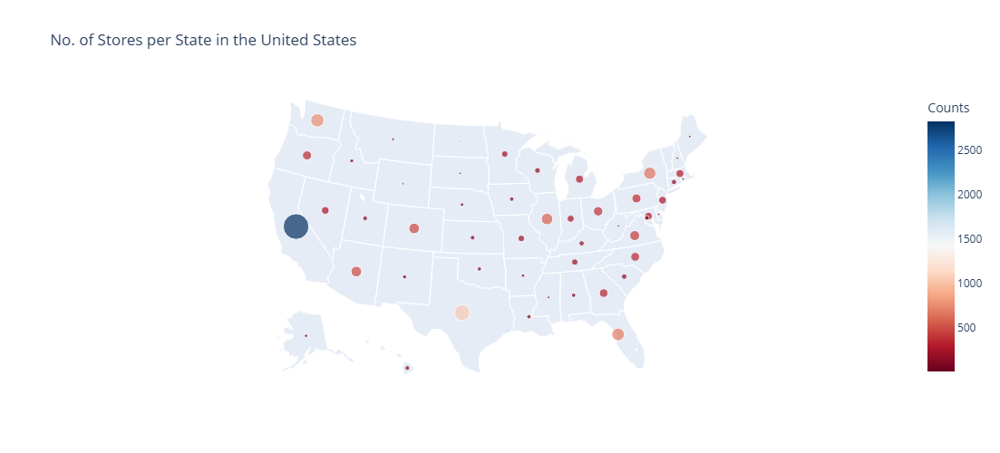

In [46]:
# No. of Stores per State in the United States

map_states_store_count = px.scatter_geo(
    starbucks_transformed[starbucks_transformed['Country_ISO'] == "US"]['State/Province'].value_counts().rename('Counts').reset_index(), 
    locationmode='USA-states',
    locations='State/Province',  
    size='Counts',
    color='Counts',
    hover_data=['Counts'],
    color_continuous_scale='RdBu',
    scope='usa',
    title='No. of Stores per State in the United States'
)

map_states_store_count.update_layout(
    width=1100, 
    height=500,  
)

#### D) EDA Summary
- In the basic data exploration, we found that some columns like Street Address, City, Postcode, Phone Number, Longitude and Latitude had missing values.
- Dropped Phone Number column since it had highest number of missing values.
- Replaced NaN values with 00000 in the postcode columns.
- Dropped a record where latitude and longitude was missing.
- There were 2 missing values in Street Address and 15 in City columns respectively, replaced those with 'Unknown'.
- After cleaning the data, the main problem was that the Country column had codes of the country instead of the full name of the country.
- With the help of python libraries converted the codes into full name of the country and also added an extra column of continents.
- Using country code it was becoming difficult to analyse the plot on the basis of the codes.
- In Univariate Analysis, with the help of Brand column, we saw that how many brands are present in the dataset, clearly `Starbucks` dominated the data.
- And using Ownership Type column, we saw that `Company Owned` clearly dominated the data with approximately 45%-50%.
- In Bivariate Analysis, we have visualized how Ownership Type is distributed in each country.
- We have taken the US in consideration, their States, and it's Ownership Type for Multivariate Analysis, it's clear that California has the highest number of stores with Company Owned Ownership.
- In Data Visualization we have plotted multiple charts, initials graphs are with respect to Top 10 countries because we did not wanted to make a messy plot, instead to keep it clean we visualized Top 10 Countries since most of the data is represented by Top 10 countries itself.
- We visualized the data on a world map, which clearly shows how Starbucks is spread across the globe and highlights the regions where they are most dominant.
- With USA being the top in having more number of stores, we further visualized USA where the stores are located in the entire country.
- Also in another graph we visualized that how many number of stores each state in the USA have Starbucks.
- Brands other than Starbucks also have a significant number of stores in USA, it have visualized it in `All Coffee Brands Locations in the United States` plot.
- There were many values in City column which were not in English, we have transformed it and convert them to English for better analysis.

## 5. Key Questions

In [47]:
# 1. Top Brands coffee stores worldwide?
starbucks_transformed['Brand'].value_counts().head()

# Answer
# Starbucks = 25248
# Teavana = 348
# Evolution Fresh = 2
# Coffee House Holdings = 1

Brand
Starbucks                25248
Teavana                    348
Evolution Fresh              2
Coffee House Holdings        1
Name: count, dtype: int64

In [48]:
# 2. Top Ownership Type of the coffee stores worldwide?
starbucks_transformed['Ownership Type'].value_counts().head(10)

# Answer
# Company Owned = 11932
# Licensed = 9375
# Joint Venture = 3975
# Franchise = 317

Ownership Type
Company Owned    11932
Licensed          9375
Joint Venture     3975
Franchise          317
Name: count, dtype: int64

In [49]:
# 3. Total countries with coffee stores worldwide?
starbucks_transformed['Country'].value_counts()

# Answer : There are total 73 countries with coffee stores worldwide listed below.

Country
United States         13608
China                  2734
Canada                 1468
Japan                  1237
Korea, Republic of      992
                      ...  
Curaçao                   3
Aruba                     3
Monaco                    2
Luxembourg                2
Andorra                   1
Name: count, Length: 73, dtype: int64

In [50]:
# 4. Top 10 countries with coffee stores worldwide?
starbucks_transformed['Country'].value_counts().head(10)

# Answer : The top 10 countries with coffee stores worldwide are listed below, while USA being the top most with more than 50%.

Country
United States                13608
China                         2734
Canada                        1468
Japan                         1237
Korea, Republic of             992
United Kingdom                 901
Mexico                         579
Taiwan, Province of China      394
Türkiye                        326
Philippines                    298
Name: count, dtype: int64

In [51]:
# 5. Total cities with coffee stores worldwide?
starbucks_transformed['Translated_City'].value_counts()

# Answer : There are total of 5451 cities with coffee stores located worldwide and they are listed below.

Translated_City
Shanghai            544
Seoul               242
Beijing             234
New York            232
London              216
                   ... 
Mersin Icel           1
Beyoglu               1
Bolu                  1
Instanbul - Asya      1
Midrand               1
Name: count, Length: 5451, dtype: int64

In [52]:
# 6. Top 10 cities with coffee stores worldwide?
starbucks_transformed['Translated_City'].value_counts().head(10)

# Answer: The top 10 cities with coffee stores worldwide are listed below, suprisingly Shanghai city of China has the highest number and New York city
#         of the USA is at the fourth place.

Translated_City
Shanghai       544
Seoul          242
Beijing        234
New York       232
London         216
Toronto        192
Mexico City    180
Chicago        180
Las Vegas      156
Seattle        156
Name: count, dtype: int64

In [53]:
# 7. Store locations continent wise
starbucks_transformed['Continent'].value_counts().sort_values(ascending=False)

# Answer: In data transformation process we grouped location into continents, North America tops this with 15732 stores.

Continent
North America    15732
Asia              7495
Europe            1873
South America      410
Oceania             46
Africa              43
Name: count, dtype: int64

In [54]:
# 8. Where should Starbucks expand next? 

store_counts = starbucks_transformed['Country'].value_counts().reset_index()
store_counts.columns = ['Country', 'Store Count']

low_store_countries = store_counts[store_counts['Store Count'] < 50]

low_store_countries = low_store_countries.reset_index(drop=True)

low_store_countries

# Answer: Starbucks can expand their business or stop their business in the following countries listed below.

,Country,Store Count
0,Egypt,31
1,Lebanon,29
2,Czechia,28
3,Greece,28
4,Romania,27
5,Viet Nam,25
6,New Zealand,24
7,Puerto Rico,24
8,Australia,22
9,Bahrain,21


In [55]:
# 9. Which cities have only one Starbucks store?

city_counts = starbucks_transformed['Translated_City'].value_counts()

single_store_cities = city_counts[city_counts == 1]

print(single_store_cities)

# Answer:
# There are 2643 cities where only a single Starbucks store is located.
# The cities where Starbucks already has a presence but minimal competition, making them good candidates for adding more stores.
# Cities where Starbucks might expand due to low presence but existing demand.
# Or close the shop depending on the revenue/sales and footfall (if available).

Translated_City
Linthicum Heights    1
Glenpool             1
BUFFALO              1
Grosse Ile           1
ELMONT               1
                    ..
Mersin Icel          1
Beyoglu              1
Bolu                 1
Instanbul - Asya     1
Midrand              1
Name: count, Length: 2643, dtype: int64


In [56]:
# 10. Which states in the USA have the highest number of Starbucks stores per capita?

us_data = starbucks_transformed[starbucks_transformed['Country_ISO'] == "US"]
# Calculate stores per state
state_counts = us_data['State/Province'].value_counts()

# Calculate average number of stores per state
avg_stores = state_counts.mean()

# Display states above the average
print("Average Stores = ", avg_stores)
print(state_counts[state_counts > avg_stores])

# Answer: 
# It helps find out which states have too many or too few stores relative to their population.
# Helps Starbucks decide where to expand or limit growth.

Average Stores =  266.8235294117647
State/Province
CA    2821
TX    1042
WA     757
FL     694
NY     645
IL     575
AZ     488
CO     481
VA     432
OH     378
OR     359
PA     357
NC     338
GA     326
MI     283
MA     273
Name: count, dtype: int64


In [57]:
# 11. Which region has stores other than Starbucks?

# Filter the brands other than Starbucks
brands_of_interest = starbucks_transformed['Brand'].unique()[1:4]

# Filter the dataframe to include only the rows where the brand is in the list
filtered_data = starbucks_transformed[starbucks_transformed['Brand'].isin(brands_of_interest)]

# Group by Brand and Country and count the occurrences
brand_country_counts = filtered_data.groupby(['Brand', 'Country']).size().reset_index(name='Count')

# Display the result
brand_country_counts

# Answer: There is strong presence of Teavana in USA, regions which has stores other than Starbucks are listed below.

,Brand,Country,Count
0,Coffee House Holdings,United States,1
1,Evolution Fresh,United States,2
2,Teavana,Canada,53
3,Teavana,Puerto Rico,1
4,Teavana,United States,294


In [58]:
# 12. Which states of the USA has Teavana brand coffee Shops instead of Starbucks?

# Filter the dataset for Teavana brand
teavana_data = starbucks_transformed[starbucks_transformed['Brand'] == 'Teavana']

# Get the unique states where Teavana is present
state_counts = teavana_data.groupby('State/Province').size().reset_index(name='Count')

state_counts_sorted = state_counts.sort_values(by='Count', ascending=False).reset_index(drop=True)

# Display the result
state_counts_sorted

# Answer: Below is the list of states where Brand Teavana has coffee stores in the USA.

,State/Province,Count
0,CA,39
1,ON,27
2,FL,23
3,NY,18
4,TX,18
5,IL,13
6,OH,12
7,NJ,12
8,MA,11
9,MI,11


In [59]:
# 13. Which states has coffee brands other than Starbucks and Teavana in the USA?
other_brands = starbucks_transformed[(starbucks_transformed['Brand'] != 'Starbucks') & (starbucks_transformed['Brand'] != 'Teavana')]

# Get the unique states where Starbucks and Teavana is not present
state_counts = other_brands.groupby(['State/Province','Brand']).size().reset_index(name='Count')

state_counts_sorted = state_counts.sort_values(by='Count', ascending=False).reset_index(drop=True)

# Display the result
state_counts_sorted

# Answer: These 2 brands have couple of stores other than Starbucks and Teavana located in the Washington State of the USA.

,State/Province,Brand,Count
0,WA,Evolution Fresh,2
1,WA,Coffee House Holdings,1


In [60]:
# 14. Which countries have the most "Company Owned" stores?
company_owned = starbucks_transformed[starbucks_transformed['Ownership Type'] == 'Company Owned']
top_company_owned = company_owned['Country'].value_counts().head(10)
top_company_owned

# Answer: Countries with most "Company Owned" stores are listed below, while USA again tops in this category as well.

Country
United States     8226
China             1339
Canada            1097
United Kingdom     347
Thailand           289
Germany            142
Singapore          130
Brazil             102
Japan              101
France              74
Name: count, dtype: int64

In [61]:
# 15. Which countries have stores closest to the equator?
mean_latitude = starbucks_transformed.groupby('Country')['Latitude'].mean()
top_equator_countries = mean_latitude.sort_values().head(10)
top_equator_countries

# Answer : The countries with Starbucks stores closest to the equator are primarily located in the Southern Hemisphere, 
# with Singapore being the only exception in the Northern Hemisphere.

Country
New Zealand                       -39.136667
Argentina                         -34.276296
Chile                             -33.594271
Australia                         -32.502727
South Africa                      -25.986667
Brazil                            -23.225686
Bolivia, Plurinational State of   -17.762500
Peru                              -12.062809
Indonesia                          -5.928806
Singapore                           1.313154
Name: Latitude, dtype: float64

In [62]:
# 16. Which cities have the most diverse ownership types?
ownership_diversity = starbucks_transformed.groupby('City')['Ownership Type'].nunique()
top_diverse_cities = ownership_diversity.sort_values(ascending=False).head(10)
top_diverse_cities

# Answer: The cities with the most diverse ownership types, such as Portsmouth, Setagaya-ku, and Moscow, each have three distinct ownership types, 
# indicating a variety of ownership structures for Starbucks stores in these locations.

City
Portsmouth     3
Setagaya-ku    3
Moscow         3
Lancaster      3
Derby          3
Shizuoka       3
Toyota         3
Cambridge      3
Cardiff        3
Nottingham     3
Name: Ownership Type, dtype: int64

Country
Andorra                     1
Argentina                 108
Aruba                       3
Australia                  22
Austria                    18
                        ...  
Türkiye                   326
United Arab Emirates      144
United Kingdom            901
United States           13608
Viet Nam                   25
Name: Country, Length: 73, dtype: int64

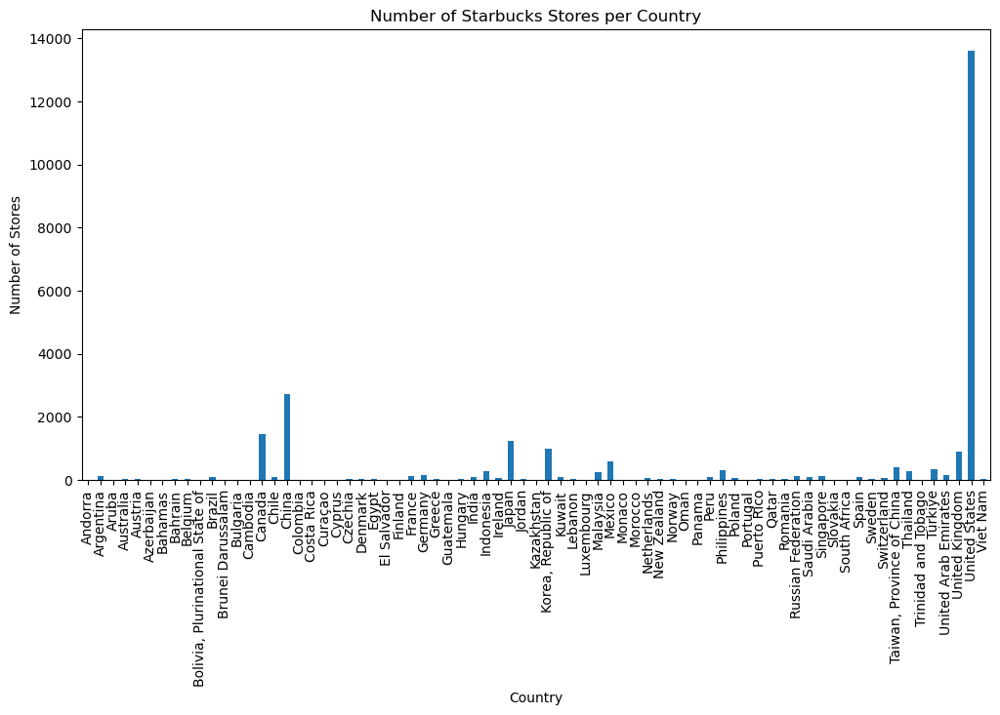

In [63]:
# 17. What is the Geographic distribution of Starbucks stores across different countries?
country_counts = starbucks_transformed.groupby('Country')['Country'].count()
display(country_counts)
country_counts.plot(kind='bar', figsize=(12, 6))
plt.title('Number of Starbucks Stores per Country')
plt.xlabel('Country')
plt.ylabel('Number of Stores')
plt.show()

Timezone
GMT+000000 Africa/Casablanca        9
GMT+000000 Africa/Johannesburg      3
GMT+000000 America/Bogota          11
GMT+000000 America/Costa_Rica      11
GMT+000000 America/Dawson_Cree      6
GMT+000000 America/El_Salvador     11
GMT+000000 America/La_Paz           4
GMT+000000 America/Panama           5
GMT+000000 America/Phoenix        487
GMT+000000 America/Port_of_Spa      3
Name: Timezone, dtype: int64

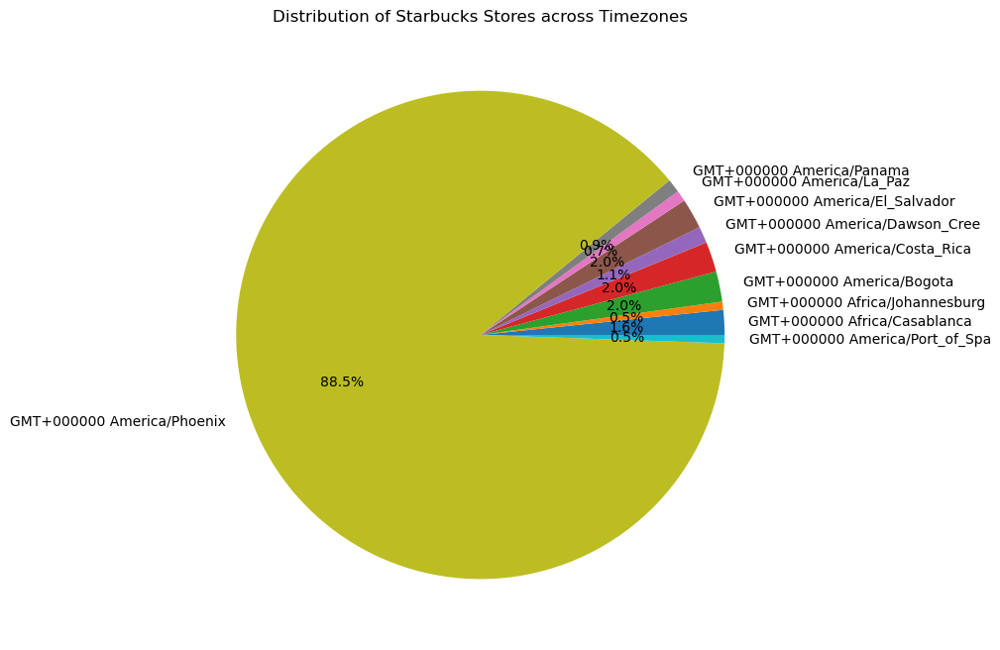

In [64]:
# 18. Prevalence of Starbucks stores in various time zones?
timezone_counts = starbucks_transformed.groupby('Timezone')['Timezone'].count().head(10)
display(timezone_counts)
timezone_counts.plot(kind='pie', autopct='%1.1f%%', figsize=(8, 8))
plt.title('Distribution of Starbucks Stores across Timezones')
plt.ylabel('')
plt.show()

## 5. Conclusion (List a minimum of 20 insights)
1. There are 25,600 starbucks opened around the world.
2. 73 countries have owned the starbucks stores.
3. There are 5471 cities with starbucks stores worldwide.
4. Vast majority of the stores are located in USA while biggest market in Canada and China. Roughly 70% per stores in Top 3 countires.
5. There are more than 50% stores in the USA.
6. If California(2821) was a country ,it would have been the biggest country for starbucks after USA. Since the second highest country China has only 2734 stores.
7. Starbucks is one of the largest coffeehouse chains in the US, with thousands of stores across the country.
8. Approx 46% of the stores are Company Owned.
9. Less than approx 2% are Franchise stores.
10. Starbucks have around 15% of the stores on Joint Venture.
11. There were 6861 missing values in Phone Number column, which is very high, had to drop it due to sigfinance high number of missing values.
12. There were 1522 missing values in Postcode column which we replaced '00000' so that it can used for analysis if required.
13. There was only a single row with no latitude and longitude value, so had to drop it.
14. There were 2 street address and 15 city values missing, replaced it with 'Unknown'.
15. Intially the dataset had Country in the form of its code so it was difficult to analysis data based on country code, simplified it with the help of a python library.
16. Also, added Continent column with the help of `pycountry` and `pycountry_convert` library.
17. More thank 80% of Starbucks stores are concentrated in just 5 countries.
18. The dataset contains only four brands, with "Starbucks" accounting for more than 91% of all entries.
19. "Company Owned" is the most prevalent ownership category, making up about 46% of all establishment.
20. There are more Starbucks locations in Shanghai alone (542) than in whole nations like Türkiye or Philippines.
21. Brands other than Starbucks, such as Teavana, Evolution Fresh, and Coffee House Holdings, have a significant presence in the United States. The USA has a substantial concentration of coffee stores for these brands.
22. Teavana has the majority of its outlets (294 out of 348) located in the United States, indicating that the USA is the primary market for this brand.
23. Brands like Evolution Fresh (2 outlets) and Coffee House Holdings (1 outlet) are also primarily located in the United States. This suggests that while these brands are present, their overall footprint is minimal compared to larger players like Starbucks or Teavana.
24. The top four countries with the largest number of coffee outlets account for approximately 70% of the global coffee store presence. This suggests that coffee consumption in these countries is significant and consistent, contributing to a major portion of the market.
25. Based on the large number of coffee stores in countries like the USA, it can be inferred that these countries exhibit higher coffee consumption levels. The presence of many stores indicates that demand for coffee is substantial in these regions.
26. Countries with fewer than 5 stores likely have lower coffee consumption levels, as fewer outlets generally correlate with lower demand. However, it is possible that some of these stores are highly profitable despite their small number, but without sales data, we cannot confirm this.
27. While the number of coffee stores may be low in certain countries, the revenue generated in those stores could still be high. The few stores in these countries might cater to niche markets or affluent consumers, explaining their continued existence despite the low store count. However, without sales or financial data, this remains speculative.
28. Some coffee brands, especially the larger ones like Starbucks, may be reaching market saturation in their primary regions (e.g., the United States). These brands may consider expanding to less saturated markets, even though the number of stores is fewer, to capture growth in emerging markets.
29. In countries with fewer stores, brand reputation and customer loyalty may be stronger factors in a store's success. These stores may offer high-quality products and a superior customer experience to ensure repeat business, even if the total market size is smaller.
30. In countries with high coffee store density, competition among brands is fierce. This means that only the strongest and most differentiated brands may survive in these competitive markets. Conversely, in low-density markets, coffee brands may face less competition, allowing them to thrive with fewer outlets.es.

#### End of Mid-Term Project